# Choice of Coordinate Basis

In prior tutorials, we have seen the importance of selecting training data that is of sufficient quality and quantity, as well as selecting the appropriate candidate function library. In addition, we must also ensure that the coordinate basis of the states that we intend to learn is intrinsic to the system to produce the best models. In this tutorial, we will cover a variety of methods to transform data into different coordinate basis such as:
1. Informed manual mapping
2. Proper orthogonal decomposition
3. Dynamic mode decomposition
4. Autoencoders

In [1]:
# Import required libraries

import os
import numpy as np
import matplotlib.pyplot as plt
import pysindy as ps
import warnings
from IPython.display import display, Math

from sindy.pdes import CylinderFlow
from sindy.ivp_solvers import rk4
from sindy.library import poly_lib, trig_lib, combine_libs
from sindy.optimizer import stlsq
from sindy.transform import dmd_svd, AESINDy
from sindy.plot_utils import init_plt_format
from sindy.utils import set_seed, print_latex_eqn
from sindy.plot_utils import visualize_ode_2d, visualize_ode_3d, visualize_pde_2d

warnings.filterwarnings('ignore', category=RuntimeWarning)
init_plt_format()
set_seed(0)

# Informed Manual Mapping

In many dynamical systems, we may measure variables that may not be intrinsic to the system itself. For example, if we were to track the motion of an undamped pendulum (whose motion depends only on its angular displacement) using video cameras, the motion tracking software may return the $xy$ positions of the mass instead of its angular displacement and velocity. Hence, we will need to map it from $xy$ into $\theta$. Let us demonstrate this now.

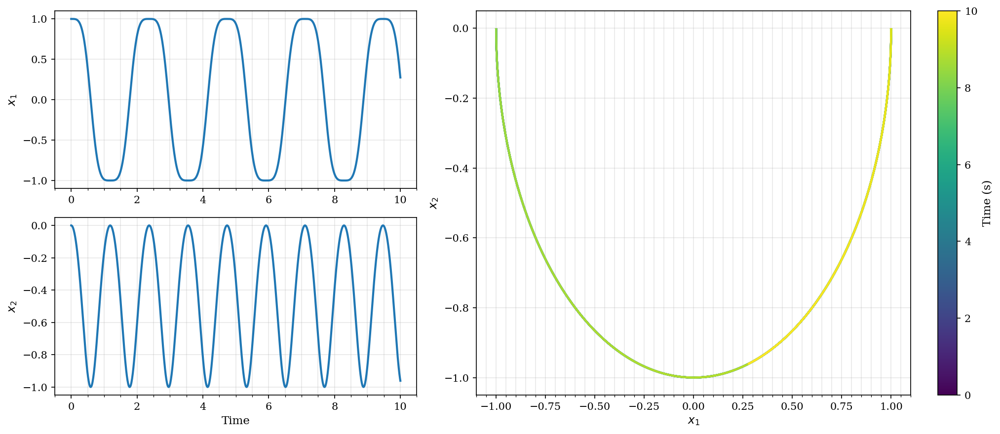

In [2]:
# Define a pendulum system
def pendulum(t, x, g=9.81, l=1):
    return np.array([x[1], -g/l * np.sin(x[0])])

# Solve the ODE
tFinal = 10
dt = 0.01
l=1
x0 = np.array([np.pi/2, 0])
t, x = rk4(pendulum, tFinal, x0, dt, l=l)

# Obtain the xy position instead
xy = np.stack((l*np.sin(x[:, 0]), -l*np.cos(x[:, 0]))).T

# Visualize the trajectory
visualize_ode_2d(xy, t)

If we attempt to identify this system using its Cartesian coordinate position, we simply will not yield a good model.

In [3]:
# Library parameters
poly_order = 5
include_bias = True
n_frequencies = 3
feature_names = ['x', 'y']

# Construct a combined polynomial and trigonometric library
lib1, lib1_names = poly_lib(xy, poly_order, include_bias, feature_names=feature_names)
lib2, lib2_names = trig_lib(xy, n_frequencies, feature_names=feature_names)
lib, lib_names = combine_libs([lib1, lib2], [lib1_names, lib2_names])

# Numerically differentiate and fit the model
xdot = ps.FiniteDifference(4, 2)._differentiate(x, t)
xi = stlsq(lib1, xdot)

display(Math(print_latex_eqn(xi, feature_names, lib1_names, dt_order=2)))

<IPython.core.display.Math object>

By using the system's intrinsic coordinate state $\theta$, we can easily recover the true equation even with an excessively large library.

In [4]:
# Library parameters
poly_order = 5
include_bias = True
n_frequencies = 3
feature_names = [r'\theta']

# Construct a combined polynomial and trigonometric library
lib1, lib1_names = poly_lib(x[:, 0:1], poly_order, include_bias, feature_names=feature_names)
lib2, lib2_names = trig_lib(x[:, 0:1], n_frequencies, feature_names=feature_names)
lib, lib_names = combine_libs([lib1, lib2], [lib1_names, lib2_names])

# Numerically differentiate and fit the model
xdot2 = ps.FiniteDifference(4, 2)._differentiate(x[:, 0:1], t)
xi = stlsq(lib, xdot2)

display(Math(print_latex_eqn(xi, feature_names, lib_names, dt_order=2)))

<IPython.core.display.Math object>

Also note that if the system is purely a 2nd order system, we can bypass the step in formulating a 1st order state space system and simply feed in the second order time derivative directly instead.

# Proper Orthogonal Decomposition (POD)

In POD (as well as DMD), the primary goal is to compress a high-dimensional system (such as the spatiotemporal flow field of a fluid) to a lower dimensional latent space. If we construct our data matrix such that

$$\boldsymbol{X} = \begin{bmatrix} \boldsymbol{x}_1 & \boldsymbol{x}_2 & ... & \boldsymbol{x}_n \end{bmatrix}$$

where $\boldsymbol{X} \in \mathbb{R}^{m \times n}$ is constructed from $n$ different measurements of the state $\boldsymbol{x}_i \in \mathbb{R}^m$. In POD, we are only concerned with finding orthogonal modes from given measurements, where the order of said measurements do not matter. In the context of a spatiotemporal system, this is equivalent to only looking at $n$ different snapshots and decomposing the field into spatial modes without consideration of temporal evolution.

We can achieve this by applying [singular value decomposition (SVD)](https://en.wikipedia.org/wiki/Singular_value_decomposition) which for a given matrix $\boldsymbol{X} \in \mathbb{R}^{m \times n}$, it can be decomposed as

$$ \boldsymbol{X} = \boldsymbol{U} \boldsymbol{\Sigma} \boldsymbol{V}^H, $$

where $(\bullet)^H$ is the Hermitian transpose. Here, we yield orthonormal matrices $\boldsymbol{U}$ and $\boldsymbol{V}^H$ (such that $\boldsymbol{U}^H \boldsymbol{U} = \boldsymbol{V}^H \boldsymbol{V} = \boldsymbol{I}$), as well as a diagonal matrix $\boldsymbol{\Sigma}$ of singular values $\sigma_i$. If $\boldsymbol{X}$ has a rank of $r \le \min(m,n)$, we can take the compact/economic form of SVD where $\boldsymbol{U} \in \mathbb{R}^{m \times r}$, $\boldsymbol{\Sigma} \in \mathbb{R}^{r \times r}$ and $\boldsymbol{V} \in \mathbb{R}^{n \times r}$. From here, we yield orthogonal spatial modes $\boldsymbol{U}$, and the modes are uniquely ranked by descending 'energy' defined in the diagonal matrix $\boldsymbol{\Sigma}$. We say 'energy' as since matrices $\boldsymbol{U}$ and $\boldsymbol{V}$ are both orthonormal, the singular values $\sigma_i$ directly quantifies the amplitude of each mode.

Let us demonstrate it on a cylinder flow problem.

In [5]:
data_dir = 'data/'
save_dir = data_dir + 'cylinder_vorticityfield.npz'

cflow = CylinderFlow(cfl=0.5)
save_interval = 50

if os.path.isfile(save_dir):
    print(f'Existing flow field solution found, loading in: {save_dir}')
    data = np.load(save_dir)
    t, omega = data['t'], data['omega']

else:
    u0 = np.load(data_dir + 'cflow_u0.npy')
    t, u = cflow.simulate(100, u0, True, save_interval)
    omega = cflow.get_vorticity(u, cflow.params)
    np.savez(
        save_dir,
        omega=omega.astype(np.float32), t=t.astype(np.float32)
    )

Existing flow field solution found, loading in: data/cylinder_vorticityfield.npz


The above solver returns the vorticity of a cylinder flow problem which can be visualized as the spatiotemporal flow field below.

In [6]:
visualize_pde_2d(
    omega[..., None], t,
    [cflow.params.x, cflow.params.y],
    frame_interval=1, equal_axis=True
)

The vorticity data $\omega$ has an incredibly high dimension of

In [7]:
print(f'{omega.shape}.')

(513, 257, 104).


Let us now apply compute the SVD of the flow field.

In [8]:
# Reshape omega into the correct data matrix shape
omega_flattened = omega.reshape((cflow.params.Nx*cflow.params.Ny, -1))

# Perform POD
U, S, Vh = np.linalg.svd(omega_flattened, full_matrices=False)

The orthogonal spatial modes are stored in the columns of the matrix $\boldsymbol{U}$. We may visualize each mode once we have shaped them back to its original spatial dimensions. We may also view its temporal evolution by computing $\sigma_i \boldsymbol{V}^H_i$.

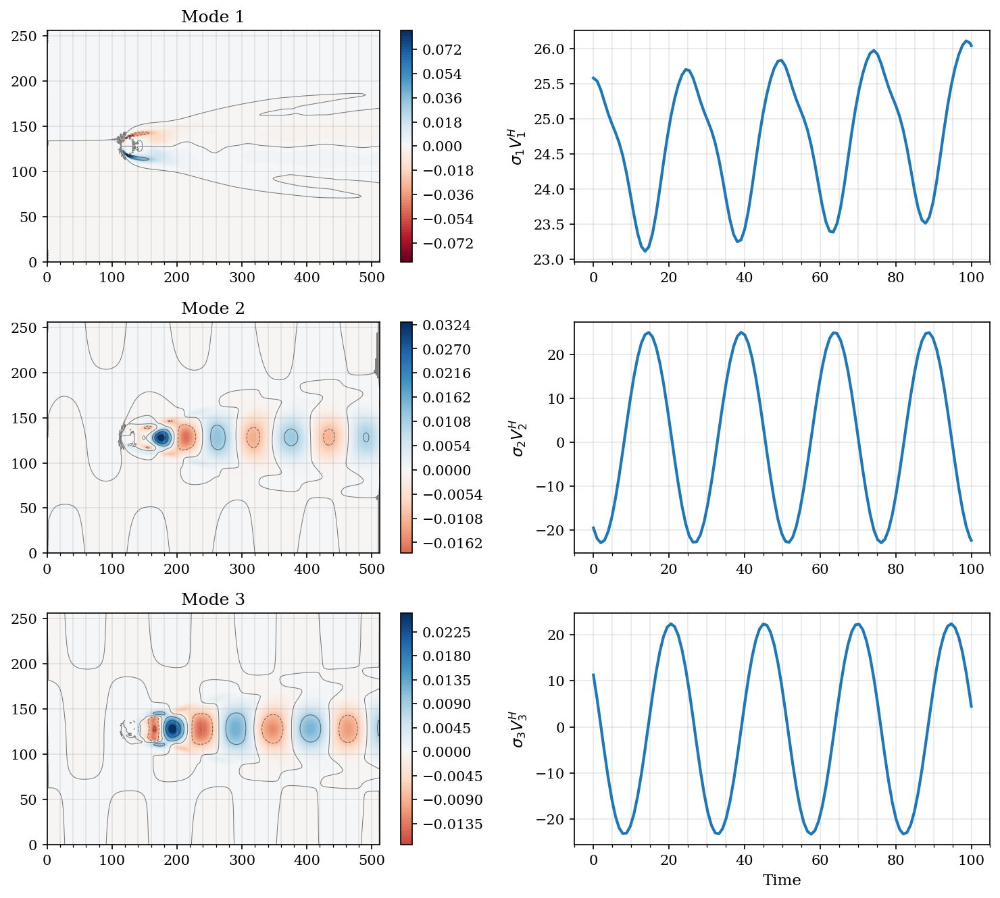

In [9]:
# Plot the first r modes
r = 3
fig, axs = plt.subplots(r, 2, figsize=(10, r*3))
for idx in range(r):

    mode_shape = U[:, idx].reshape((cflow.params.Nx, cflow.params.Ny)).T
    vmax = np.max(np.abs(mode_shape))

    cplt = axs[idx, 0].contourf(
        mode_shape, cmap='RdBu', levels=100,
        vmin=-vmax, vmax=vmax
    )
    axs[idx, 0].contour(
        mode_shape, levels=5, colors='k', linewidths=0.5, alpha=0.5,
        vmin=-vmax, vmax=vmax
    )
    fig.colorbar(cplt, ax=axs[idx, 0])

    axs[idx, 0].set_title(f'Mode {idx+1}')
    axs[idx, 1].plot(t, S[idx]*Vh[idx, :])
    axs[idx, 1].set_ylabel(rf'$\sigma_{idx+1} V^H_{idx+1}$')
    
axs[idx, 1].set_xlabel('Time')
fig.tight_layout()

## Learning a SINDy Model on the Latent Space

Once we obtain the spatial modes, we may also project new data into the same latent space which we'll refer to as $\boldsymbol{Z}$, which is mapped via

$$\boldsymbol{Z} = \varphi(\boldsymbol{X}) = \boldsymbol{U}^T \boldsymbol{X}.$$

We can then remap from the latent space back to the original space with

$$\boldsymbol{X} = \varphi(\boldsymbol{Z}) = \boldsymbol{U} \boldsymbol{Z}.$$

Let us try this with the data we already have.

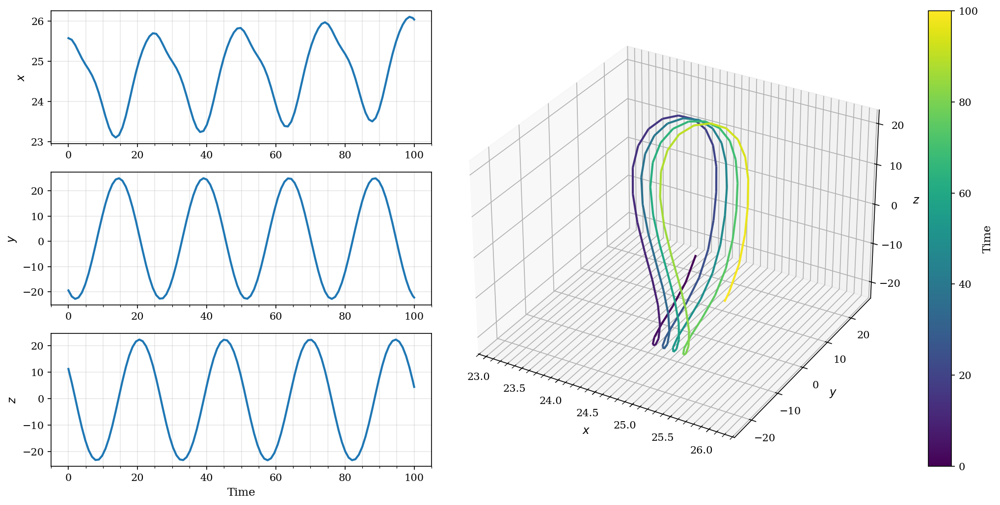

In [10]:
# Specify latent space dimension
latent_dim = 3

# Define functions to map to and from latent space
phi = lambda x: U[:, :latent_dim].T @ x
psi = lambda z: U[:, :latent_dim] @ z

# Map to latent space and visualize
z = phi(omega_flattened)
visualize_ode_3d(z.T, t)

As observed, this obtains the same results as $\sigma_i \boldsymbol{V}^H_i$ when using the same data. Now that we have a lower dimension time-series data, we can readily apply SINDy to discover an underlying dynamical system model.

In [11]:
# SINDy settings
poly_order = 3
include_bias = True
feature_names = [f'z_{i+1}' for i in range(latent_dim)]

# Learn a model in the latent space
zdot = ps.FiniteDifference(4)._differentiate(z.T, t)
lib, lib_names = poly_lib(
    z.T, poly_order, include_bias, feature_names=feature_names
)
xi = stlsq(lib, zdot)

display(Math(print_latex_eqn(xi, feature_names, lib_names)))

<IPython.core.display.Math object>

We make future predictions by integrating the ODE in the latent space, before projecting the results back to the full spatiotemporal domain with $\psi(\boldsymbol{Z})$.

In [12]:
# Predict the trajectory in the latent space
f_pred = lambda t, x: poly_lib(x.reshape((1,-1)), poly_order, include_bias)[0] @ xi
t_pred, z_pred = rk4(f_pred, t[-1], z[:, 0], cflow.params.dt)

# Map it back into the original space via the decoder
x_pred = psi(z_pred.T)

# Visualize the prediction
visualize_pde_2d(
    x_pred.reshape((cflow.params.Nx, cflow.params.Ny, -1, 1)), t_pred,
    [cflow.params.x, cflow.params.y],
    frame_interval=None, equal_axis=True
)

Whilst the macro features of the flow field has been reconstructed, we lack the smaller scale features with only three POD modes. Consequently, the reconstructed flow is actually non-physical. By increasing the number of modes, we may yield a more accurate reconstruction.

# Dynamic Mode Decomposition (DMD)

Similar to POD, the dynamic mode decomposition (DMD) is a commonly used dimension reduction technique within the fluid dynamics community to identify the spatial-temporal patterns within a fluid flow. It is closely related to the Koopman theory where we aim to map a snapshot of the flow at the current time step $k$ to the next time step such that

$$ \boldsymbol{q}_{k+1} = \boldsymbol{A} \boldsymbol{q}_k $$

where $\boldsymbol{q}_k$ is a snapshot of a flow quantity of interest such as temperature flattened into a vector. Unlike POD, DMD does not generate orthogonal mode shapes but solve the eigendecomposition problem for the temporal mapping matrix $\boldsymbol{A}$. We begin by concatenating the snapshots into a data matrix

$$ \boldsymbol{X} = \begin{bmatrix} \boldsymbol{q}_1 & \boldsymbol{q}_2 & \dots & \boldsymbol{q}_{n-1} \end{bmatrix}, $$

along with its time shifted component

$$ \boldsymbol{Y} = \begin{bmatrix} \boldsymbol{q}_2 & \boldsymbol{q}_3 & \dots & \boldsymbol{q}_{n} \end{bmatrix}, $$

we may use $\boldsymbol{A}$ to map from $\boldsymbol{X}$ to $\boldsymbol{Y}$ such that

$$ \boldsymbol{Y} = \boldsymbol{A} \boldsymbol{X}. $$

A simple solution to find $\boldsymbol{A}$ is via least squares regression such that

$$ \boldsymbol{A}_{LS} = \underset{\boldsymbol{A}}{\arg\!\min} || \boldsymbol{Y} - \boldsymbol{A} \boldsymbol{X} ||^2_F, $$

which has a convex solution of

$$ \boldsymbol{A}_{LS} = \boldsymbol{Y} \boldsymbol{X} (\boldsymbol{X} \boldsymbol{X}^H)^{-1}. $$

However, in many fluid flow simulations, the total number of spatial grid coordinates is vast compared to the number of snapshots in time. If $n+1$ is the total number of snapshots in time and $m$ is the total number of spatial grids, then $\boldsymbol{X} \in \mathbb{R}^{m \times n}$ and $\boldsymbol{Y} \in \mathbb{R}^{m \times n}$. Consequently, solving for the least squares solution of $\boldsymbol{A}_{LS}$ requires inverting a very large matrix that is $\mathbb{R}^{m \times m}$, which is also likely to be rank-deficient.

There are a number of DMD variants that addresses this very issue. We will follow the method proposed by [(Loiseau, 2020)](https://link.springer.com/article/10.1007/s00162-020-00536-w) to reformulate the least squares regression into a reduced rank regression.

## Reduced Rank Regression

If $\boldsymbol{A}$ is a low rank matrix, it can be factorised as $\boldsymbol{A} = \boldsymbol{P} \boldsymbol{Q}^H$ where $\boldsymbol{P} \in \mathbb{R}^{m \times r}$ and $\boldsymbol{Q} \in \mathbb{R}^{m \times r}$ are two rank-$r$ matrices. If we assume that $\boldsymbol{P}$ forms a $r$ orthonormal set of $m$ sized vectors such that $\boldsymbol{P}^H \boldsymbol{P} = \boldsymbol{I}$, then the least squares regression becomes

$$
\begin{aligned}
    \min_{\boldsymbol{P}, \boldsymbol{Q}} \quad& || \boldsymbol{Y} - \boldsymbol{P} \boldsymbol{Q}^H \boldsymbol{X} ||_F^2 \\
    \text{s.t.} \quad& \text{rank } \boldsymbol{P} = r, \\
    & \text{rank } \boldsymbol{Q} = r, \\
    & \boldsymbol{P}^H \boldsymbol{P} = \boldsymbol{I}.
\end{aligned}
$$

which is a type of reduced rank regression problem. For brevity sake, let us define

$$
\begin{aligned}
    \boldsymbol{C}_{xx} &= \boldsymbol{X} \boldsymbol{X}^H, \\
    \boldsymbol{C}_{yx} &= \boldsymbol{Y} \boldsymbol{X}^H, \\
    \boldsymbol{C}_{xy} &= \boldsymbol{X} \boldsymbol{Y}^H.
\end{aligned}
$$

[(Loiseau, 2020)](https://link.springer.com/article/10.1007/s00162-020-00536-w) showed that this is equivalent to the trace maximisation problem of

$$
\begin{aligned}
    \max_{\boldsymbol{P}} \quad& \text{Tr} \left( \boldsymbol{P}^H \boldsymbol{C}_{yx} \boldsymbol{C}_{xx}^{-1} \boldsymbol{C}_{xy} \boldsymbol{P} \right) \\
    \text{s.t.} \quad& \text{rank } \boldsymbol{P} = r, \\
    & \boldsymbol{P}^H \boldsymbol{P} = \boldsymbol{I}.
\end{aligned}
$$

Since $\boldsymbol{C}_{yx} \boldsymbol{C}_{xx}^{-1} \boldsymbol{C}_{xy}$ is a Hermitian, positive semi-definite matrix, it can be shown that the columns of $P$ are simply the $r$-leading eigenvectors of $\boldsymbol{C}_{yx} \boldsymbol{C}_{xx}^{-1} \boldsymbol{C}_{xy}$. Subsequently, we may compute

$$ \boldsymbol{Q} = \boldsymbol{C}_{xx}^{-1} \boldsymbol{C}_{xy} \boldsymbol{P}. $$

Now that the factorised $\boldsymbol{P}$ and $\boldsymbol{Q}$ matrices are found, we can use these matrices to solve a reduced eigendecomposition of

$$ \boldsymbol{A} \boldsymbol{\Psi}_i = \boldsymbol{\Psi}_i \lambda_i $$

to find the $i\text{th}$ DMD mode. Whilst the columns of $P$ are not the DMD modes, they span the same column space as $\boldsymbol{\Psi}$. Thus, we can reformulate $\boldsymbol{\Psi}$ as a linear combination of the columns of $\boldsymbol{P}$ such that

$$ \boldsymbol{\Psi}_i = \boldsymbol{P} \boldsymbol{b}_i $$

where $\boldsymbol{b} \in \mathbb{C}^{r}$. This allows us to reformulate the eigendecomposition as

$$
\begin{aligned}
    \boldsymbol{P} \boldsymbol{Q}^H (\boldsymbol{P} \boldsymbol{b}_i) =& (\boldsymbol{P} \boldsymbol{b}_i) \lambda_i \\
    \boldsymbol{Q}^H \boldsymbol{P} \boldsymbol{b}_i =& \boldsymbol{b}_i \lambda_i
\end{aligned}
$$

where we solve for the eigenvectors of $\boldsymbol{Q}^H \boldsymbol{P} \in \mathbb{R}^{r \times r}$.


## Code Implementation

Loiseau provided an [implementation](https://gist.github.com/loiseaujc/0c544e4f6fef4079d909306e00b6a73e) of this formulation for the ease of understanding:

---

```python
# Author : Jean-Christophe Loiseau <jean-christophe.loiseau@ensam.eu>
# Date : July 2020

# --> Standard python libraries.
import numpy as np
from scipy.linalg import pinv, eigh, eig

def dmd_analysis(x, y=None, rank=2):
  
  # --> Partition data matrix into X and Y.
  if y is None:
    x, y = x[:, :-1], x[:, 1:]
    
  # --> Pre-compute the covariance and cross-covariance matrices.
  Cxx, Cyx = x @ x.T, y @ x.T
  pinv_Cxx = pinv(Cxx)
  
  # --> Compute the eigenspectrum of the symmetric positive definite matrix.
  #     appearing in the closed-form solution of the DMD problem.
  #     Inspecting its eigenspectrum will help choosing an appropriate rank for the model.
  sigma, P = eigh(np.linalg.multi_dot([Cyx, pinv_Cxx, Cyx.T]))
  
  # --> Sort and normalize the eigenvalues.
  idx = np.argsort(-sigma)
  sigma, P = sigma[idx], P[:, idx]
  sigma /= np.sum(sigma)
  
  # --> Truncate the output basis to the desired rank.
  P = P[:, :rank].reshape(-1, rank)
  
  # --> Compute the basis for the input space.
  Q = (Cyx @ pinv_Cxx).T @ P
  
  # --> Compute the eigenpairs of the low-dimensional DMD operator.
  mu, psi, phi = eig(Q.T @ P, left=True, right=True)
  
  # --> Compute the high-dimensional DMD modes.
  phi, psi = P @ phi, Q @ psi
  
  # --> Normalize using their bi-orthogonal property.
  M = psi.T.conj() @ phi
  
  if rank > 1:
    psi /= np.diag(M).conj()
   else:
    psi /= M.conj()
    
  return P, Q, sigma, mu
```

---

However, as highlighted in his work, computing the eigendecomposition for a vast $\boldsymbol{C}_{yx} \boldsymbol{C}_{xx}^{-1} \boldsymbol{C}_{xy}$ and the pseudoinverse of $\boldsymbol{C}_{xx}$ are extremely computationally expensive. But since $m>>n$, we may employ singular value decomposition (SVD). Let us begin by applying SVD to

$$
\begin{aligned}
    \boldsymbol{X} &= \boldsymbol{U}_{\boldsymbol{X}} \boldsymbol{\Sigma}_{\boldsymbol{X}} \boldsymbol{V}_{\boldsymbol{X}}^H, \\
    \boldsymbol{X}^H &= \boldsymbol{V}_{\boldsymbol{X}} \boldsymbol{\Sigma}_{\boldsymbol{X}} \boldsymbol{U}_{\boldsymbol{X}}^H.
\end{aligned}
$$

From which, we can show that

$$
\begin{aligned}
    \boldsymbol{C}_{yx} \boldsymbol{C}_{xx}^{-1} \boldsymbol{C}_{xy} = (\boldsymbol{Y} \boldsymbol{V}_{\boldsymbol{X}}) (\boldsymbol{Y} \boldsymbol{V}_{\boldsymbol{X}})^H.
\end{aligned}
$$

For a matrix in the form $\boldsymbol{Z} \boldsymbol{Z}^H$, it can be expressed as

$$
\boldsymbol{Z} \boldsymbol{Z}^H
    = \underbrace{\boldsymbol{V_Z} \boldsymbol{\Lambda_Z} \boldsymbol{V_Z}^{-1}}_{\text{From eigendecomposition}}
    = \underbrace{\boldsymbol{U}_{\boldsymbol{Z}} \boldsymbol{\Sigma}_{\boldsymbol{Z}}^2 \boldsymbol{U}_{\boldsymbol{Z}}^H}_{\text{From SVD of } \boldsymbol{Z}}.
$$

From the above, it can be shown the leading $r$ eigenvectors are also the leading $r$ left singular vectors $\boldsymbol{U}_{\boldsymbol{Z}}$ and the eigenvalues are simply the square of $\boldsymbol{\Sigma}_{\boldsymbol{Z}}$.

Using SVD of $\boldsymbol{X}$, we may also reformulate $\boldsymbol{Q}$ as

$$ \boldsymbol{Q} = \boldsymbol{U}_{\boldsymbol{X}} \boldsymbol{\Sigma}_{\boldsymbol{X}}^{-1} (\boldsymbol{Y} \boldsymbol{V}_{\boldsymbol{X}})^H \boldsymbol{P}. $$

Then we may compute the rank-$r$ eigendecomposition of $\boldsymbol{Q}^H \boldsymbol{P}$.

We provide an example implementation in the following function `dmd_svd`.

In [13]:
dmd_svd??

Signature: dmd_svd(x: numpy.ndarray, y: numpy.ndarray = None, rank: int = 2) -> tuple[numpy.ndarray, numpy.ndarray]
Source:   
def dmd_svd(
        x: np.ndarray, y: np.ndarray=None, rank: int = 2
) -> tuple[np.ndarray, np.ndarray]:
    """
    A SVD implementation of (Loiseau, 2020)'s DMD.

    Args:
        x (np.ndarray): The data matrix X.
        y (np.ndarray, optional): The time shifted data matrix of X. Defaults
            to None, which creates a time shifted data matrix from X.
        rank (int, optional): The DMD rank to extract. Defaults to 2.

    Returns:
        tuple[np.ndarray, np.ndarray]: Returns the DMD mode projection matrix
            and the eigenspectrum.
    """

    if y is None:
        x, y = x[:, :-1], x[:, 1:]

    # Obtain the SVD for X
    Ux, Sx, VxH = np.linalg.svd(x, full_matrices=False)

    # Compute Y V_X^H
    YVx = y @ VxH.T

    # Compute the eigendecomposition with SVD
    P, sigma, _ = np.linalg.svd(YVx, full_matrices=False)
    sigma *= si

We may now apply this to the cylinder flow problem.

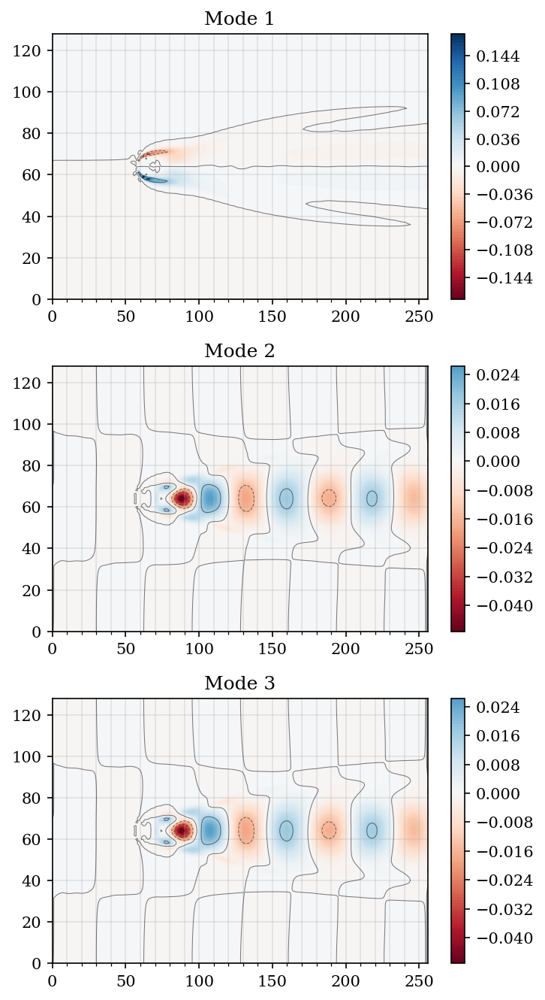

In [14]:
# Subsample omega spatially to speed up DMD
omega_subsampled = omega[::2, ::2, ...]
omega_reshaped = omega_subsampled.reshape(
    (omega_subsampled.shape[0]*omega_subsampled.shape[1], -1)
)

# Created shifted omega matrices
omega_X = omega_reshaped[:, :-1].astype(np.float32)
omega_Y = omega_reshaped[:, 1:].astype(np.float32)

# Perform DMD on the first r ranks
r = 3
psi, sigma = dmd_svd(omega_X, omega_Y, r)

# Plot the first r modes
fig, axs = plt.subplots(r, 1, figsize=(5, r*3))
for idx in range(r):

    mode_shape = psi[:, idx].reshape((
        omega_subsampled.shape[0], omega_subsampled.shape[1]
    )).T
    vmax = np.max(np.abs(mode_shape))

    cplt = axs[idx].contourf(
        mode_shape, cmap='RdBu', levels=100,
        vmin=-vmax, vmax=vmax
    )
    axs[idx].contour(
        mode_shape, levels=5, colors='k', linewidths=0.5, alpha=0.5,
        vmin=-vmax, vmax=vmax
    )
    fig.colorbar(cplt, ax=axs[idx])

    axs[idx].set_title(f'Mode {idx+1}')

fig.tight_layout()

Whilst the modes appear similar to that POD, they are not orthogonal. We may also plot the normalized eigenspectrum to identify the rank at which we can truncate at.

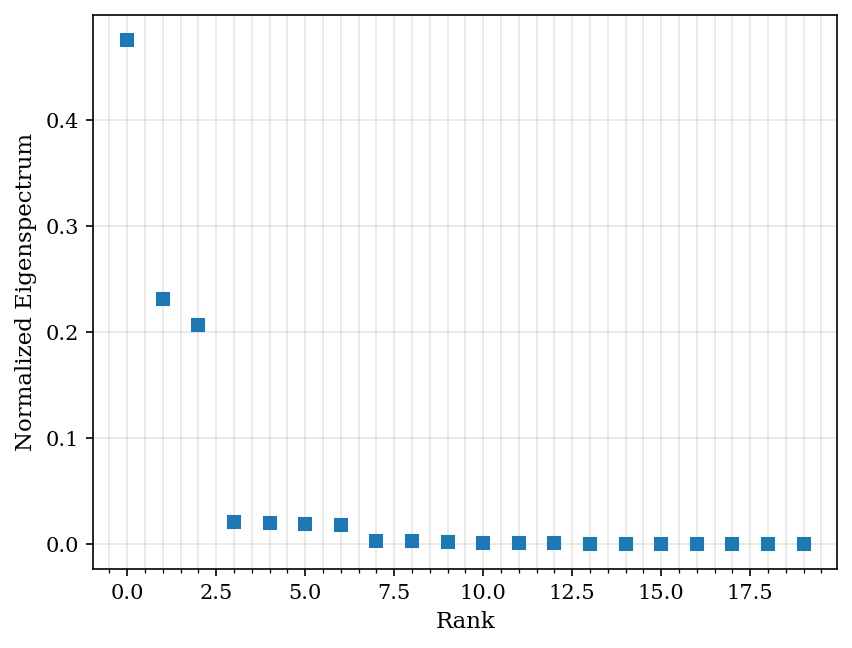

In [15]:
r = 20
plt.plot(np.arange(r), sigma[:r], 's')
plt.xlabel('Rank')
plt.ylabel('Normalized Eigenspectrum');

As shown above, the first three modes capture the majority of the system. We may then project the data using DMD modes onto a lower dimensional space to learn a SINDy model, similar to the process shown for POD. Such an example can be found in [3-5 Learning ODE with DMD](../S3%20Thermosyphon%20Heat%20Exchanger/3-5%20Learning%20ODE%20with%20DMD.ipynb) tutorial where we apply DMD to learn the chaotic dynamics of a thermosyphon.

> Can you try writing a code that maps the full state flow field into the low-dimensional DMD modes and learn a SINDy model within the latent space?

# Autoencoders

Autoencoders are a type of neural networks that aims to compress the input data to a lower dimensional latent space. It consists of two main parts: an encoder $\varphi: \mathbb{R}^n \to \mathbb{R}^r$ and a decoder $\psi: \mathbb{R}^r \to \mathbb{R}^n$. The training aims to minimize the reconstruction loss of the data such that the loss minimization problem is defined as

$$\min [\boldsymbol{x} - \psi(\boldsymbol{z})] = \min [\boldsymbol{x} - \psi(\varphi(\boldsymbol{x}))].$$

Such neural networks provide another option to transform/compress data from a high dimensional space to a lower dimensional space. This can be combined with SINDy as first demonstrated by [(Champion et al, 2019)](https://www.pnas.org/doi/abs/10.1073/pnas.1906995116) which enables the simultaneous learning of both dimensionality reduction mapping as well as the sparse governing dynamics within the latent space.

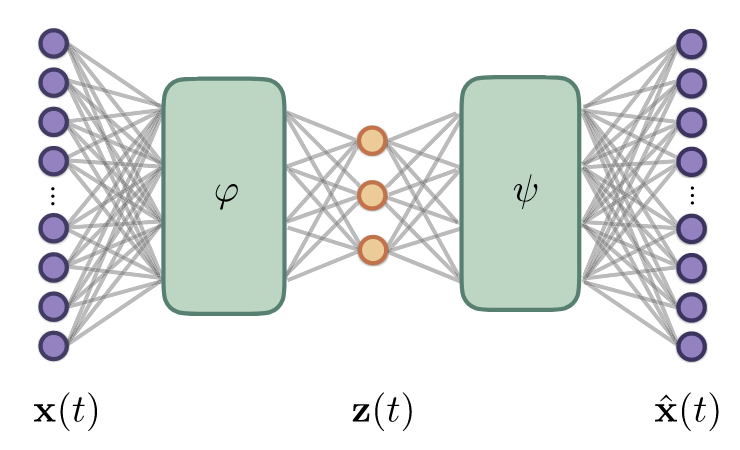

A trainable SINDy layer was inserted in the bottleneck of the autoencoder which operates on the latent space $\boldsymbol{z}$. The layer builds up the nonlinear candidate function library $\Theta(\boldsymbol{z})$ before multiplying it with a trainable parameter matrix $\Xi$ to compute the predicted latent space time derivative

$$\hat{\dot{\boldsymbol{z}}} = \Theta(\boldsymbol{z}) \Xi.$$

We also train the encoder $\varphi$ and decoder $\psi$ to reconstruct the time derivatives accurately such that

$$
\begin{aligned}
    \dot{\boldsymbol{Z}} &= \varphi(\dot{\boldsymbol{X}}),    \\
    \dot{\boldsymbol{X}} &= \psi(\dot{\boldsymbol{Z}}).
\end{aligned}
$$

To ensure this is the case, the method adds additional loss components such that the total loss is

$$
\mathcal{L} =
    \underbrace{|| \boldsymbol{x} - \psi(\boldsymbol{z}) ||^2_2}_{\text{reconstruction loss}}
    + \underbrace{\lambda_1 ||
        \dot{\boldsymbol{x}}
        - \left( \nabla_{\boldsymbol{z}} \psi(\boldsymbol{z}) \right)
        \left( \Theta(\boldsymbol{z}^T) \Xi \right)
    ||^2_2}_{\text{SINDy loss in }\dot{\boldsymbol{x}}}
    + \underbrace{\lambda_2 ||
        \left( \nabla_{\boldsymbol{x}} \boldsymbol{z} \right) \dot{\boldsymbol{x}}
        - \Theta(\boldsymbol{z}^T) \Xi
    ||^2_2}_{\text{SINDy loss in }\dot{\boldsymbol{z}}}
    + \underbrace{\lambda_3 || \Xi ||_1}_{\substack{\text{SINDy} \\ \text{regularization}}}.
$$

The extra loss components promote the desired coordinate transformation behavior. However, this is not a hard constraint, and requires careful tuning of the various loss weights $\lambda_i$ to achieve good results. Further information on tuning these weights can be found in the supplementary information of [(Champion et al, 2019)](https://www.pnas.org/doi/abs/10.1073/pnas.1906995116).

## Linear Autoencoder-SINDy

In this tutorial, due to training times and complexity of neural networks, we will instead implement a simplified linear autoencoder instead. In linear autoencoders, we assume that data in the $\boldsymbol{x} \in \mathbb{R}^{n}$ can be transformed into the latent space $\boldsymbol{z} \in \mathbb{R}^{q}$ and back with a transformation matrix such that

$$
\begin{aligned}
    Z &= \varphi(X) = A_E X, \\
    \hat{X} &= \psi(Z) = A_D Z,
\end{aligned}
$$

where $A_E$ and $A_D$ are the encoder and decoder transformation matrices respectively, and $\hat{(\bullet)}$ denotes predicted values. Matrices $X \in \mathbb{R}^{n \times m}$ and $Z \in \mathbb{R}^{q \times m}$ are batched data of $\boldsymbol{x}$ and $\boldsymbol{z}$ respectively. This is equivalent to using a neural-network based autoencoder with no bias terms and a linear activation function.

Similarly, when constructing the loss function later, we wish to promote

$$
\begin{aligned}
    \dot{Z} &= \varphi(\dot{X}) = A_E \dot{X}, \\
    \hat{\dot{X}} &= \psi(\dot{Z}) = A_D \dot{Z}.
\end{aligned}
$$

We implement SINDy on the latent space such that

$$\hat{\dot{Z}} = \left( \Theta (Z^T) \Xi \right)^T.$$

To simplify the update rule further, we will only implement a linear library such that $\Theta (Z^T) = Z^T$, such that we may obtain a straight forward loss function.

Now, we can reformulate a loss function using mean squared errors of its residuals for the linear SINDy autoencoder as

$$
\begin{aligned}
    \mathcal{L} &=
        \underbrace{|| X - \hat{X} ||^2_\text{F}}_{\text{reconstruction loss}}
        + \underbrace{\lambda_1 || \dot{X} - \hat{\dot{X}} ||^2_\text{F}}_{\text{SINDy loss in }\dot{\boldsymbol{x}}}
        + \underbrace{\lambda_2 || \dot{Z} - \hat{\dot{Z}} ||^2_\text{F}}_{\text{SINDy loss in }\dot{\boldsymbol{z}}}
        + \underbrace{\lambda_3 || \Xi ||_2}_{\substack{\text{SINDy} \\ \text{regularization}}} \\
    &=
        || \underbrace{X - A_D A_E X}_{R_{\text{recon}}} ||^2_\text{F}
        + \lambda_1 || \underbrace{\dot{X} - A_D \Xi^T A_E X}_{R_{\dot{\boldsymbol{x}}}} ||^2_\text{F}
        + \lambda_2 || \underbrace{\dot{Z} - \Xi^T A_E X}_{R_{\dot{\boldsymbol{z}}}} ||^2_\text{F}
        + \lambda_3 || \Xi ||_2,
\end{aligned}
$$

where $R$ is the residual of each loss component. We replace the original L1 regularizer with L2 regularizer for the purpose of gradient based methods. Then, we can implement a gradient descent rule to optimize for

$$\min_{A_E, A_D, \Xi} \mathcal{L},$$

such that

$$
\begin{aligned}
    A_E^{k+1} &= A_E^k - \alpha \nabla_{A_E} \mathcal{L}, \\
    A_D^{k+1} &= A_D^k - \alpha \nabla_{A_D} \mathcal{L}, \\
    \Xi^{k+1} &= \Xi^k - \alpha \nabla_{\Xi} \mathcal{L},
\end{aligned}
$$

where $\alpha$ is the learning rate. The gradients $\nabla_{A_E} \mathcal{L}$, $\nabla_{A_D} \mathcal{L}$ and $\nabla_{\Xi} \mathcal{L}$ are

$$
\begin{aligned}
    \nabla_{A_E} \mathcal{L} &=
        - A_D^T R_{\text{recon}} X^T
        - \lambda_1 \Xi A_D^T R_{\dot{\boldsymbol{x}}} X^T
        + \lambda_2 (R_{\dot{\boldsymbol{z}}} \dot{X}^T - \Xi R_{\dot{\boldsymbol{z}}} X^T), \\
    \nabla_{A_D} \mathcal{L} &=
        - R_{\text{recon}} (A_E X)^T
        - \lambda_1 R_{\dot{\boldsymbol{x}}} (A_E X)^T \Xi, \\
    \nabla_{\Xi} \mathcal{L} &=
        - \lambda_1 A_E X R_{\dot{\boldsymbol{x}}}^T A_D
        - \lambda_2 A_E X R_{\dot{\boldsymbol{z}}}^T
        + \lambda_3 \Xi.
\end{aligned}
$$

The linear autoencoder SINDy is implemented in `AESINDy` where the gradient descent algorithm can be found in

In [16]:
AESINDy._train_step??

Signature:
AESINDy._train_step(
    self,
    X_batch: numpy.ndarray,
    X_dot_batch: numpy.ndarray,
    lr: float,
)
Source:   
    def _train_step(self, X_batch: np.ndarray, X_dot_batch: np.ndarray, lr: float):
        """
        Perform one gradient descent step on a batch.

        Parameters:
        -----------
        X_batch : np.ndarray, shape (n, batch_size)
            X data batch
        X_dot_batch : np.ndarray, shape (batch_size, batch_size)
            X data time derivative batch
        lr : float
            Learning rate
        """

        # Compute intermediate matrices
        Z = self.A_E @ X_batch
        Z_dot = self.A_E @ X_dot_batch
        Z_dot_hat = self.Xi.T @ Z

        X_hat = self.A_D @ Z
        X_dot_hat = self.A_D @ Z_dot_hat
        
        # Residuals
        R_recon = X_batch - X_hat
        R_zdot = Z_dot - Z_dot_hat
        R_xdot = X_dot_batch - X_dot_hat

        # Get matrix sizes for MSE scaling
        n_recon = R_recon.size
        n

Similar to [(Champion et al, 2019)](https://www.pnas.org/doi/abs/10.1073/pnas.1906995116), at every $N$ epoch interval, we will perform a thresholding on the $\Xi$ matrix.

---

Let us now train the linear autoencoder-SINDy on the cylinder flow data.

In [17]:
# Subsample omega spatially to speed up training
omega_subsampled = omega[::2, ::2, ...]
omega_reshaped = omega_subsampled.reshape(
    (omega_subsampled.shape[0]*omega_subsampled.shape[1], -1)
)

# Specify autoencoder latent dimension
latent_dim = 3

# Specify loss component weights
lambda_xdot = 1e-1
lambda_zdot = 1e-4
lambda_l2 = 1e-5

# Get time related information
dt_data = t[1] - t[0]
tFinal_data = t[-1]

# Train the linear autoencoder-SINDy
set_seed(10)
aesindy = AESINDy(
    omega_reshaped.shape[0], latent_dim,
    lambda_xdot, lambda_zdot, lambda_l2,
    threshold_reg=0.03, threshold_freq=30, deriv_order=4
)
history = aesindy.fit(omega_reshaped, dt_data, epochs=80, batch_size=16, lr=50)

Epoch 1 | Loss: 0.004796: 100%|██████████| 7/7 [00:00<00:00, 88.45it/s]
Epoch 2 | Loss: 0.004801: 100%|██████████| 7/7 [00:00<00:00, 94.80it/s]
Epoch 3 | Loss: 0.004850: 100%|██████████| 7/7 [00:00<00:00, 96.02it/s]
Epoch 4 | Loss: 0.005224: 100%|██████████| 7/7 [00:00<00:00, 97.31it/s]
Epoch 5 | Loss: 0.004452: 100%|██████████| 7/7 [00:00<00:00, 97.99it/s]
Epoch 6 | Loss: 0.002717: 100%|██████████| 7/7 [00:00<00:00, 97.83it/s]
Epoch 7 | Loss: 0.002535: 100%|██████████| 7/7 [00:00<00:00, 100.73it/s]
Epoch 8 | Loss: 0.002513: 100%|██████████| 7/7 [00:00<00:00, 99.85it/s]
Epoch 9 | Loss: 0.002432: 100%|██████████| 7/7 [00:00<00:00, 100.42it/s]
Epoch 10 | Loss: 0.002323: 100%|██████████| 7/7 [00:00<00:00, 100.73it/s]
Epoch 11 | Loss: 0.002148: 100%|██████████| 7/7 [00:00<00:00, 100.96it/s]
Epoch 12 | Loss: 0.001925: 100%|██████████| 7/7 [00:00<00:00, 102.12it/s]
Epoch 13 | Loss: 0.001707: 100%|██████████| 7/7 [00:00<00:00, 101.37it/s]
Epoch 14 | Loss: 0.001542: 100%|██████████| 7/7 [00:00

To help troubleshoot the training process, we can also visualize the loss curves of the various components below as well as display the learned equation.

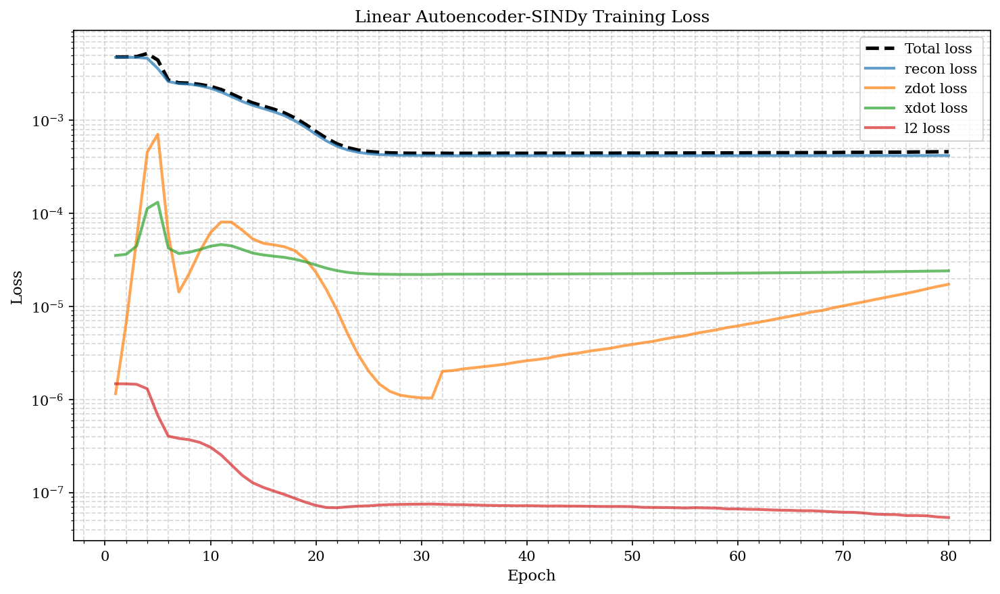

Learned SINDy equation:


<IPython.core.display.Math object>

In [18]:
loss_keys = list(history[0].keys())
epochs = np.arange(1, len(history) + 1)

# Extract component values
loss_values = np.array([[epoch_loss[k] for k in loss_keys] for epoch_loss in history]).T

# Compute total loss per epoch
total_loss = np.sum(loss_values, axis=0)

plt.figure(figsize=(10, 6))

# Plot total loss
plt.plot(epochs, total_loss, label="Total loss", linewidth=2.5, color='k', linestyle='--')

# Plot loss components
for i, key in enumerate(loss_keys):
    plt.plot(epochs, loss_values[i], label=f"{key} loss", alpha=0.7)

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.yscale('log')
plt.title("Linear Autoencoder-SINDy Training Loss")
plt.legend(loc='upper right')
plt.grid(True, which="both", ls="--", alpha=0.5)
plt.tight_layout()
plt.show()

print('Learned SINDy equation:')
display(Math(aesindy.get_eqn()))

There are a number of core components we can verify in the model. First, we can verify its ability to reconstruct the data accurately using the learned encoder and decoder mappings. We can do this by passing in data into `AESINDy.reconstruct` which only utilizes the encoder and decoder whilst bypassing the SINDy layer.

In [19]:
# Obtain the reconstructed data
omega_recon = aesindy.reconstruct(omega_reshaped)

# Visualize the flow reconstruction
visualize_pde_2d(
    omega_recon.reshape((*omega_subsampled.shape, 1)),
    np.arange(0, tFinal_data, dt_data),
    [
        np.linspace(0, cflow.params.Lx, omega_subsampled.shape[0]),
        np.linspace(0, cflow.params.Ly, omega_subsampled.shape[1])
    ],
    equal_axis=True
)

Furthermore, we can then predict the evolution of the flow on the latent space by integrating the learned equation forwards in time.

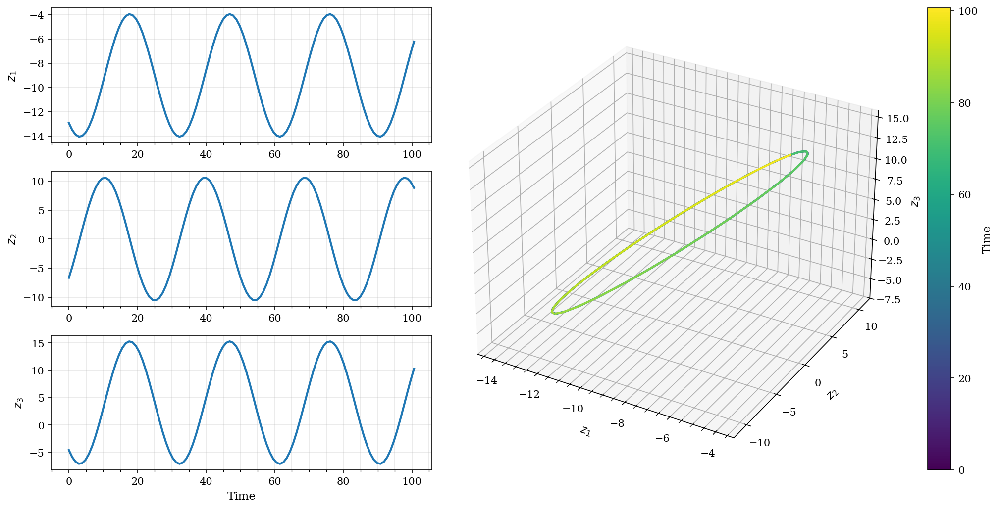

In [20]:
# Predict the flow on the lower dimensional space
t_pred, omega_pred, z_pred = aesindy.predict(
    omega_reshaped[:, 0],
    tFinal=tFinal_data, dt=dt_data
)
omega_recon = (aesindy.A_D @ aesindy.A_E @ omega_reshaped).reshape((*omega_subsampled.shape, 1))

# Visualize the evolution on the latent space
visualize_ode_3d(
    z_pred.T, t_pred,
    labels=[f'z_{{{idx+1:d}}}' for idx in range(latent_dim)]
)

# Visualize the evolution of the spatiotemporal system
visualize_pde_2d(
    omega_pred.reshape((*omega_subsampled.shape[:2], t_pred.shape[0], 1)), t_pred,
    [
        np.linspace(0, cflow.params.Lx, omega_recon.shape[0]),
        np.linspace(0, cflow.params.Ly, omega_recon.shape[1])
    ],
    equal_axis=True
)

Whilst an oscillatory mode can be learned here, a linear autoencoder (as well as its linear candidate function library) cannot discover the limit cycle behavior of a real cylinder flow. However, this serves as a simple and fast running demonstration to gain an intuition over the autoencoder-SINDy architecture.

> A proper [autoencoder-SINDy implementation](https://github.com/kpchamp/SindyAutoencoders) can be extremely powerful and can create accurate reconstructions even with a high data compression ratio, but it requires quite a significant effort in tuning the relevant hyperparameters for both SINDy and the autoencoder.

In this tutorial, we have covered various methods of compressing high-dimensional data into a lower-dimensional ODE that can be more readily learned using SINDy with methods such as
* Proper orthogonal decomposition
* Dynamic mode decomposition
* Autoencoders (with a simple linear encoding and decoding)